In [1]:
import tensorflow as tf
import os
import cv2
import matplotlib.pyplot as plt
import imghdr

## 1 Preprocess Data

#### 1.1 Remove the unwanted image formats.

In [2]:
data_dir = "Data"

In [3]:
os.listdir(data_dir)

['angry', 'happy', 'sad']

In [4]:
image_extensions = ["jpeg","jpg", "bmp", "png"] #JPEG, PNG, GIF, BMP

In [5]:
for image_class in os.listdir(data_dir):
    print("Class:", image_class,", Image count:", len(os.listdir(os.path.join(data_dir, image_class))))
    for image in os.listdir(os.path.join(data_dir,image_class)):
        try:
            img = cv2.imread(os.path.join(data_dir, image_class, image))
            tip = imghdr.what(os.path.join(data_dir, image_class, image))
            if tip not in image_extensions:
                os.remove(os.path.join(data_dir, image_class, image))
                print("Deleted", os.path.join(data_dir, image_class, image))
        except:
            os.remove(os.path.join(data_dir, image_class, image))
            print("Removed:", os.remove(os.path.join(data_dir, image_class, image)))

Class: angry , Image count: 191


Class: happy , Image count: 184
Class: sad , Image count: 194


In [6]:
for image_class in os.listdir(data_dir):
    print("Class:", image_class,", Image count:", len(os.listdir(os.path.join(data_dir, image_class))))

Class: angry , Image count: 191
Class: happy , Image count: 184
Class: sad , Image count: 194


#### 1.2 Show sample image

Text(0.5, 1.0, 'Happy')

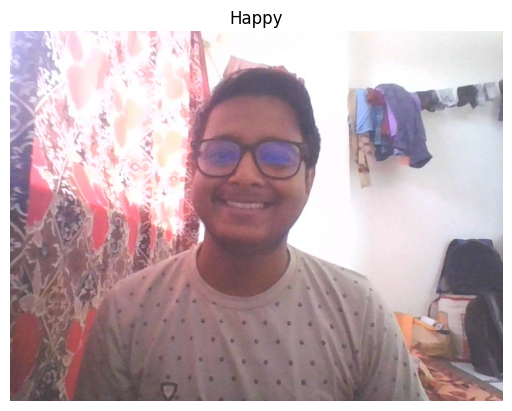

In [7]:
img = cv2.imread("Data\happy\8.jpg")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Happy")

Text(0.5, 1.0, 'Sad')

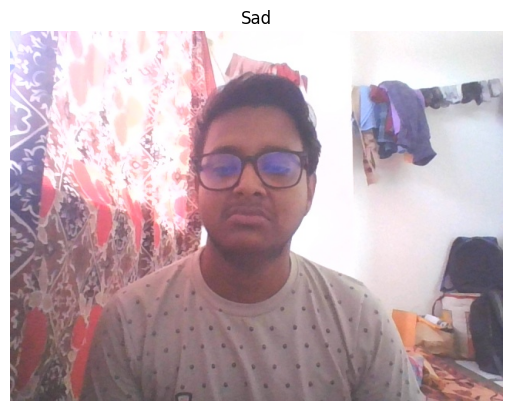

In [8]:
img = cv2.imread("Data\sad\8.jpg")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Sad")

Text(0.5, 1.0, 'Angry')

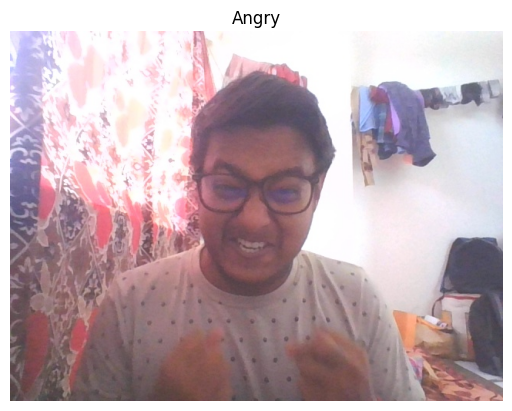

In [9]:
img = cv2.imread("Data\\angry\\9.jpg")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Angry")

## 2 Load Data

### 2.1 Import dependencies

In [61]:
# keras.utils.image_dataset_from_directory can be used to auto label the data and store into dataset object.
# Then it can be accessed from numpy_iterator with next method.
# Each next call will return one batch at a time.

In [10]:
import numpy as np
import matplotlib.pyplot as plt

### 2.2 Create tf.Data object for categorical data

In [11]:
data = tf.keras.utils.image_dataset_from_directory(data_dir, label_mode='categorical')

Found 569 files belonging to 3 classes.


In [13]:
data_iterator = data.as_numpy_iterator()

In [14]:
batch = data_iterator.next()

In [16]:
batch[0].shape

(32, 256, 256, 3)

In [60]:
# - [0,1,0] => Happy
# - [0,0,1] => Sad
# - [1,0,0] => Angry

## 3 Pre process data
### 3.1 Scale data

In [25]:
data = data.map(lambda x, y : (x/255,y))

In [26]:
data.as_numpy_iterator().next()[1].shape

(32, 3)

### 3.2 Split Data

In [62]:
# [0,0,1] => Sad, [0,1,0] => Happy, [1,0,0] => Angry

In [27]:
train_size = int(len(data)*0.7)+1
valid_size = int(len(data)*0.2)
test_size = int(len(data)*0.1)+1

In [28]:
train = data.take(train_size)
valid = data.skip(train_size).take(valid_size)
test = data.skip(train_size + valid_size).take(test_size)

In [29]:
batch = test.as_numpy_iterator().next()

In [31]:
len(data)

18

## 4 Build Model

### 4.1 Import dependencies

In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout

### 4.2 Create model and add layers

In [33]:
model = Sequential()

In [34]:
model.add(Conv2D(16, (3,3), 1, padding='same', activation='relu', input_shape = (256,256,3)))
model.add(MaxPool2D())

model.add(Conv2D(32, (3,3), 1, padding='same', activation='relu'))
model.add(MaxPool2D())

model.add(Conv2D(64, (3,3), 1, padding='same', activation='relu'))
model.add(MaxPool2D())

model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dense(3, activation='softmax'))

### 4.3 Compile and print summacy

In [35]:
model.compile('adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [36]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 32, 32, 64)       0

## 5 Training The Model

### 5.1 Create TensorBoard Directory

In [37]:
log_dir = 'logs'

In [38]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

### 5.2 Fit the model

In [39]:
hist = model.fit(train, validation_data=valid, epochs=20, callbacks=[tensorboard_callback], use_multiprocessing=True)

Epoch 1/20
13/13 [==============================] - 24s 2s/step - loss: 2.7248 - accuracy: 0.3918 - val_loss: 1.0550 - val_accuracy: 0.3646
Epoch 2/20
13/13 [==============================] - 20s 1s/step - loss: 1.0112 - accuracy: 0.5120 - val_loss: 0.8849 - val_accuracy: 0.5625
Epoch 3/20
13/13 [==============================] - 15s 1s/step - loss: 0.7372 - accuracy: 0.7163 - val_loss: 0.4395 - val_accuracy: 0.9688
Epoch 4/20
13/13 [==============================] - 17s 1s/step - loss: 0.3220 - accuracy: 0.9279 - val_loss: 0.2311 - val_accuracy: 0.9062
Epoch 5/20
13/13 [==============================] - 17s 1s/step - loss: 0.1880 - accuracy: 0.9375 - val_loss: 0.1017 - val_accuracy: 0.9479
Epoch 6/20
13/13 [==============================] - 17s 1s/step - loss: 0.0758 - accuracy: 0.9808 - val_loss: 0.0781 - val_accuracy: 0.9792
Epoch 7/20
13/13 [==============================] - 17s 1s/step - loss: 0.0521 - accuracy: 0.9808 - val_loss: 0.0801 - val_accuracy: 0.9583
Epoch 8/20
13/13 [==

### 5.3 Save the model

In [40]:
model.save("model.h5")

### 5.4 Plot the training metrics

Text(0.5, 1.0, 'Accuracy')

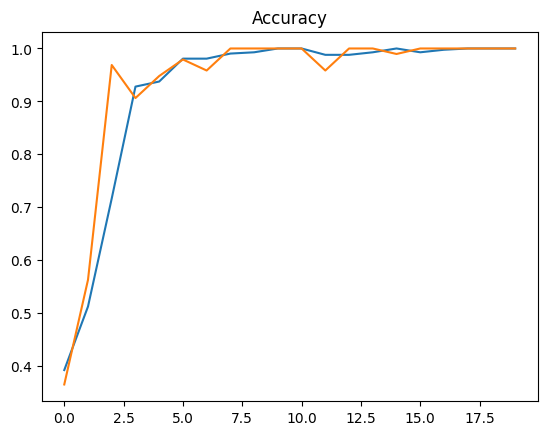

In [41]:
plt.plot(hist.history["accuracy"])
plt.plot(hist.history["val_accuracy"])
plt.title("Accuracy")

Text(0.5, 1.0, 'Loss')

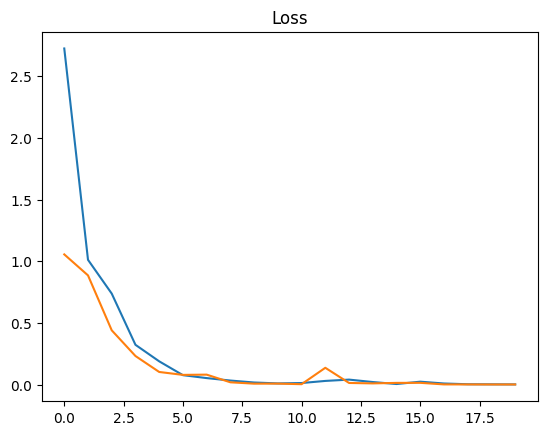

In [42]:
plt.plot(hist.history["loss"])
plt.plot(hist.history["val_loss"])
plt.title("Loss")

## 6 Evaluate Performance

### 6.1 Import Dependencies

In [43]:
from tensorflow.keras.metrics import Precision, Recall, CategoricalAccuracy

In [44]:
pre = Precision()
rec = Recall()
acc = CategoricalAccuracy()

In [45]:
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)
    pre.update_state(y, yhat)
    rec.update_state(y, yhat)
    acc.update_state(y, yhat)

1/1 [==============================] - 0s 266ms/step


In [46]:
print(f"Precision: {pre.result().numpy()}, Recall: {rec.result().numpy()}, Accuracy: {acc.result().numpy()}")

Precision: 1.0, Recall: 1.0, Accuracy: 1.0


### 6.2 Test Visualization
[0,0,1] => Sad, [0,1,0] => Happy, [1,0,0] => Angry

In [40]:
def decode_prediction(y_hat):
    # - [0,1,0] => Happy
    # - [0,0,1] => Sad
    # - [1,0,0] => Angry
    maps = ['Angry', "Happy", "Sad"]
    maxs = np.argmax(y_hat, axis=1)
    decoded_emotions = []
    for m  in maxs:
        decoded_emotions.append(maps[m])
    decoded_emotions = np.array(decoded_emotions).reshape(-1,1)
    return decoded_emotions

In [52]:
batch = test.as_numpy_iterator().next()
y_hat = model.predict(batch[0])

1/1 [==============================] - 0s 250ms/step


In [53]:
decoded = decode_prediction(y_hat)

C:\Users\Win10\AppData\Local\Temp\ipykernel_14836\633374531.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


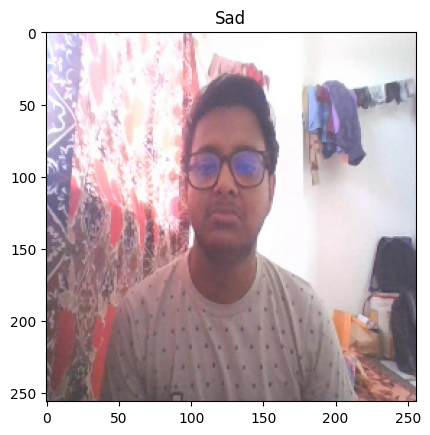

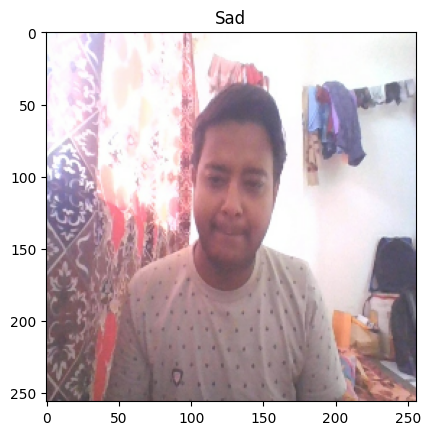

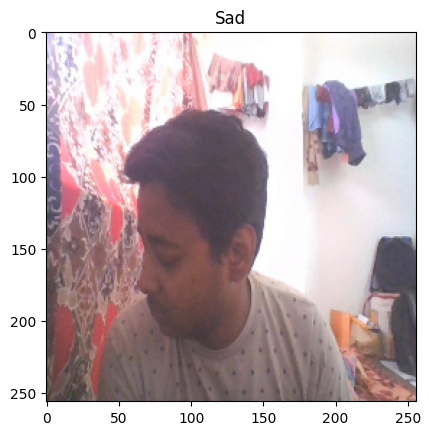

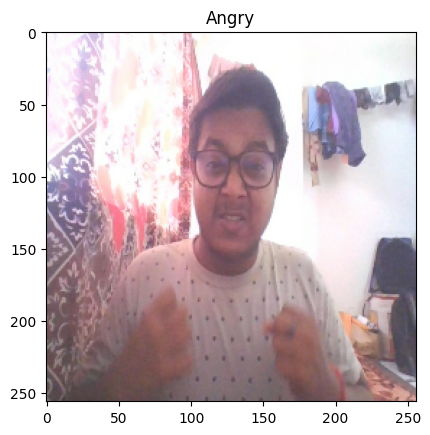

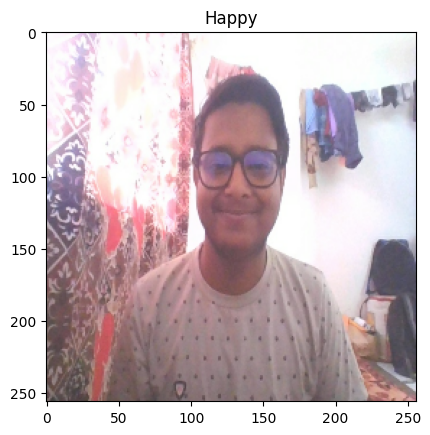

...

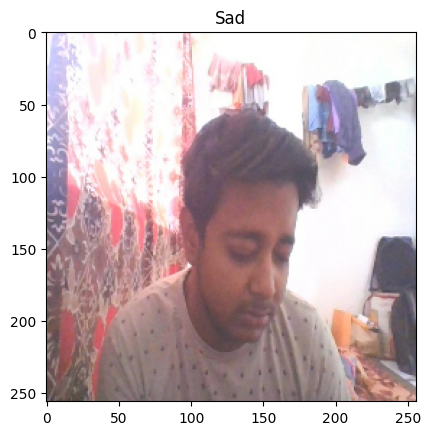

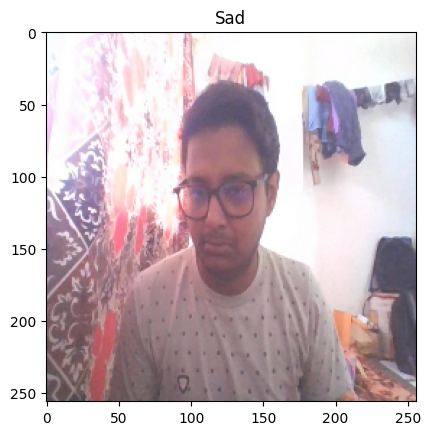

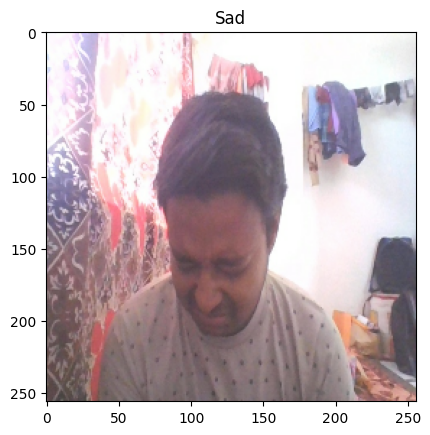

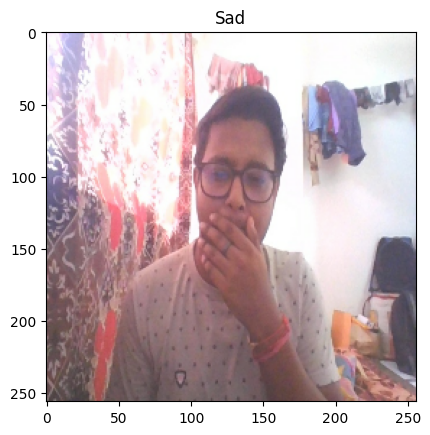

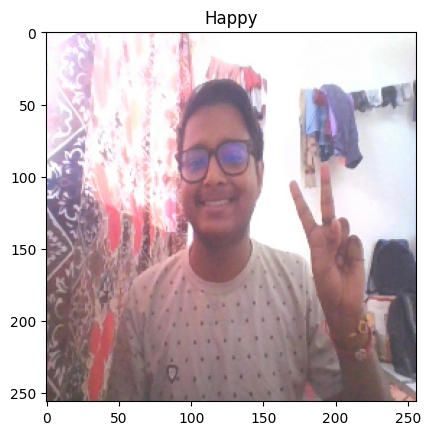

In [57]:
for x,y in zip(batch[0]*255, decoded):
    x = x.astype(np.int32)
    plt.figure()
    plt.imshow(x)
    plt.title(y[0])

## 7 New Data Data Loading

### 7.1 Import dependencies

In [64]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import os

### 7.2 Load model

In [4]:
model = tf.keras.models.load_model("model.h5")

### 7.3 Load Data as numpy array and preprocess

In [52]:
images = os.listdir("Data/angry/")

In [53]:
images_to_model = []
for image in images:
    img = tf.io.read_file(os.path.join("Data/angry", image))
    img = tf.io.decode_jpeg(img)
    img = tf.image.resize(img, (256,256))
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # resized = cv2.resize(img, (256,256))
    # array = np.array(resized.tolist())/255
    array = img.numpy()/255
    images_to_model.append(array)
    # print(array)
images_to_model = np.array(images_to_model)
images_to_model.shape

(191, 256, 256, 3)

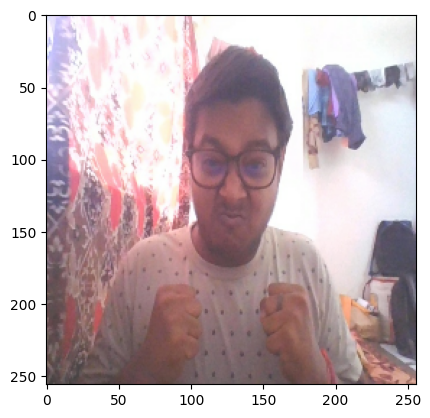

In [54]:
plt.imshow(img.numpy().astype(np.int32))

### 7.4 Predict using model.predict

In [56]:
pred = model.predict(images_to_model)

6/6 [==============================] - 2s 267ms/step


In [58]:
np.argmax(pred, axis=1)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)